Refrensi:
- [Click Here for Data](https://www.kaggle.com/datasets/kongaevans/speaker-recognition-dataset)

- [Click Here for My Reference Notebook - 1](https://www.kaggle.com/code/alkanerturan/speakerrecognition/notebook)

- [Click Here for My Reference Notebook - 2](https://www.kaggle.com/code/dhivyeshrk/audio-emotion-classification)

In [50]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [51]:
# # Set-up Env Variable for kaggle Config
# import os
# os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/Colab Notebooks/1. BISA AI - [Studi Independen]/Natural Language Preprocessing/Final Project [Speech Classification Menggunakan Machine Learning]'

# # Download and Unzip the dataset
# # Dengan cara ***Pilih Dataset*** di ***Kaggle***, lalu klik ***Titik Tiga***, dan pilih ***Copy API Command***

# # Tentukan path untuk menyimpan dataset
# path_to_save = '/content/drive/MyDrive/Colab Notebooks/1. BISA AI - [Studi Independen]/Natural Language Preprocessing/Final Project [Speech Classification Menggunakan Machine Learning]/Voice-Recognition-Dataset/'

# # Buat direktori jika belum ada
# os.makedirs(path_to_save, exist_ok=True)

# # Unduh dataset menggunakan perintah kaggle
# !kaggle datasets download -d kongaevans/speaker-recognition-dataset -p '{path_to_save}'

In [52]:
# # Ekstrak dataset
# !unzip '{path_to_save}/speaker-recognition-dataset.zip' -d '{path_to_save}'

In [53]:
# # Hapus file zip jika diperlukan
# os.remove(f'{path_to_save}/speaker-recognition-dataset.zip')

# Library

In [54]:
import pandas as pd
import numpy as np

import os
import sys

# librosa is a Python library for analyzing audio and music. It can be used to extract the data from the audio files we will see it later.
import librosa
import librosa.display
import seaborn as sns
import IPython.display as ipd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split


# to play the audio files
from IPython.display import display, Audio

import keras
from keras.utils import to_categorical
from keras.callbacks import ReduceLROnPlateau
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, Dropout, BatchNormalization
from keras.callbacks import ModelCheckpoint

import warnings
if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)

# Path

In [55]:
mainPath = "/content/drive/MyDrive/Colab Notebooks/1. BISA AI - [Studi Independen]/Natural Language Preprocessing/Final Project [Speech Classification Menggunakan Machine Learning]/"
dataPath = mainPath + "Voice-Recognition-Dataset/"

# Read My Voice and segment it

In [56]:
pip install pydub # ---  Belum Bisa --- Data sudah ada.

In [57]:
from pydub import AudioSegment
import os

def cut_audio_pydub(audio_path, output_dir, segment_duration):
    audio = AudioSegment.from_file(audio_path)
    segment_duration_ms = segment_duration * 1000
    total_duration_ms = len(audio)

    # Get the base name of the file (e.g., "file.wav")
    base_name = os.path.splitext(os.path.basename(audio_path))[0]

    for i in range(0, total_duration_ms, segment_duration_ms):
        start_time = i
        end_time = min(i + segment_duration_ms, total_duration_ms)
        segment = audio[start_time:end_time]
        segment_number = (i // segment_duration_ms)
        output_path = os.path.join(output_dir, f"{segment_number}.wav")
        segment.export(output_path, format="wav")
        print(f"Saved {output_path}")

## Enhance my audio

In [58]:
# Baca audio dan buat agar lebih keras, karena aku ngerekamnya kurang keras suaraku

# Parameters
audio_path = mainPath + 'Rendika Voice/[FULL] Rendika Nurhartanto Suharto.mp3' # Audio before enhance volume

# Load the audio file
audio = AudioSegment.from_file(audio_path)

# Increase the volume by 25 dB (you can adjust this value as needed)
louder_audio = audio + 20 # Enhance volume

## Duration Trimming

In [59]:
# Potong audio dari 2 detik hingga detik ke 3.40 sisanya dibuang

# Convert start time to milliseconds (2 detik)
start_time = 2 * 1000  # 2 detik * 1000 milidetik/detik

# Convert end time to milliseconds (3 menit + 40 detik)
end_time = (3 * 60 + 40) * 1000  # (3 menit * 60 detik/menit + 40 detik) * 1000 milidetik/detik

# Cut the audio from start_time to end_time
cut_louder_audio = louder_audio[start_time:end_time]

## Export the final audio to a new file

In [60]:
# # Export the louder audio to a new file
cut_louder_audio.export(mainPath + "Rendika Voice/louder_Rendika Nurhartanto Suharto.wav", format="wav")

audio_path = mainPath + "Rendika Voice/louder_Rendika Nurhartanto Suharto.wav" # Audio after enhance volumen

## Segmentation into audio parts

In [61]:
# Segmentasi audio menjadi beberapa part, sesuai dengan segment duration dan duration of the audio file.

output_dir = dataPath + 'Rendika Nurhartanto Suharto/'
segment_duration = 1  # duration of each segment in seconds

# Ensure the output directory exists
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

cut_audio_pydub(audio_path, output_dir, segment_duration)

In [62]:
# # Display audio
# Audio(audio_path)

# Combined files for each Speaker

In [63]:
import librosa
import soundfile as sf

# Path to the dataset
dataset_path = dataPath

# Output directory to save the combined files
output_dir = dataPath + "combined_files"

# Create the output directory if it doesn't exist
os.makedirs(output_dir, exist_ok=True)

# List of speaker folders
speaker_folders = [
    "Benjamin_Netanyau",
    "Jens_Stoltenberg",
    "Julia_Gillard",
    "Magaret_Tarcher",
    "Nelson_Mandela",
    "Rendika Nurhartanto Suharto"
]

# Number of files to combine for each speaker
num_files_to_combine = 200

# Iterate over each speaker's folder
for speaker_folder in speaker_folders:
    speaker_folder_path = os.path.join(dataset_path, speaker_folder)

    # List the first num_files_to_combine WAV files in the speaker's folder
    wav_files = [f"{i}.wav" for i in range(num_files_to_combine)]

    # Combine all WAV files into a single long file
    combined_audio = []
    for wav_file in wav_files:
        wav_file_path = os.path.join(speaker_folder_path, wav_file)
        audio, sr = librosa.load(wav_file_path, sr=None)
        combined_audio.extend(audio)

    # Save the combined audio file
    output_file_path = os.path.join(output_dir, f"{speaker_folder}_combined.wav")
    sf.write(output_file_path, combined_audio, sr)

print("Combination complete. Combined files saved in:", output_dir)

In [64]:
# Function to play audio file
def play_audio(audio_path):
    display(Audio(filename=audio_path))

# Play a specific combined audio file
speaker_folder = "Benjamin_Netanyau_combined"
audio_path = os.path.join(output_dir, f"{speaker_folder}.wav")
print(f"Click the play button to listen: {audio_path}")
play_audio(audio_path)

Click the play button to listen: /content/drive/MyDrive/Colab Notebooks/1. BISA AI - [Studi Independen]/Natural Language Preprocessing/Final Project [Speech Classification Menggunakan Machine Learning]/Voice-Recognition-Dataset/combined_files/Benjamin_Netanyau_combined.wav


# DATA VISUALIZATIONS

<ipython-input-83-8ed3acc4cdb6>:19: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


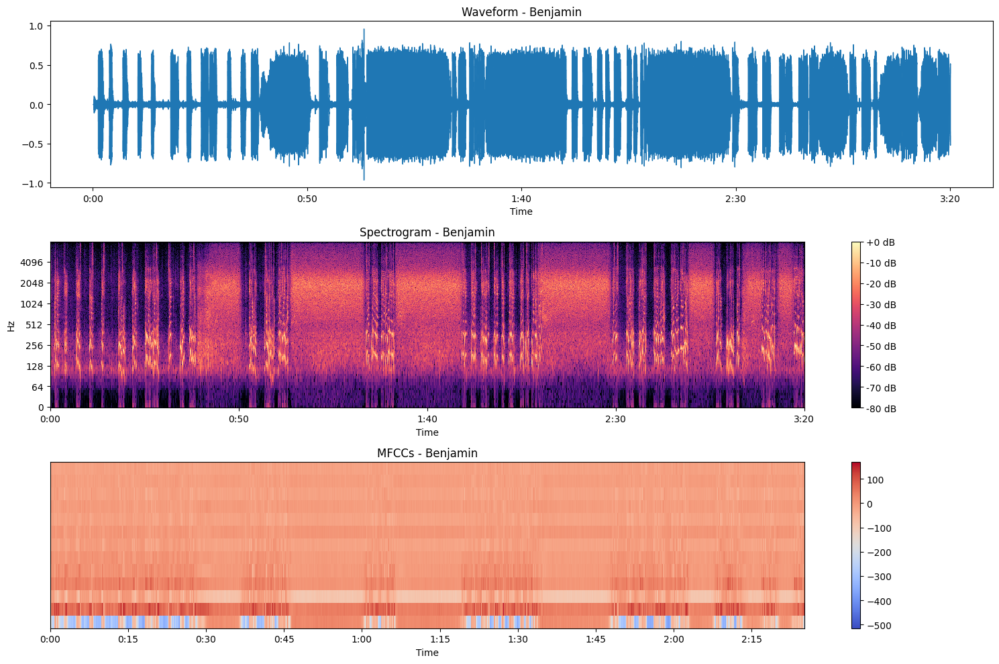

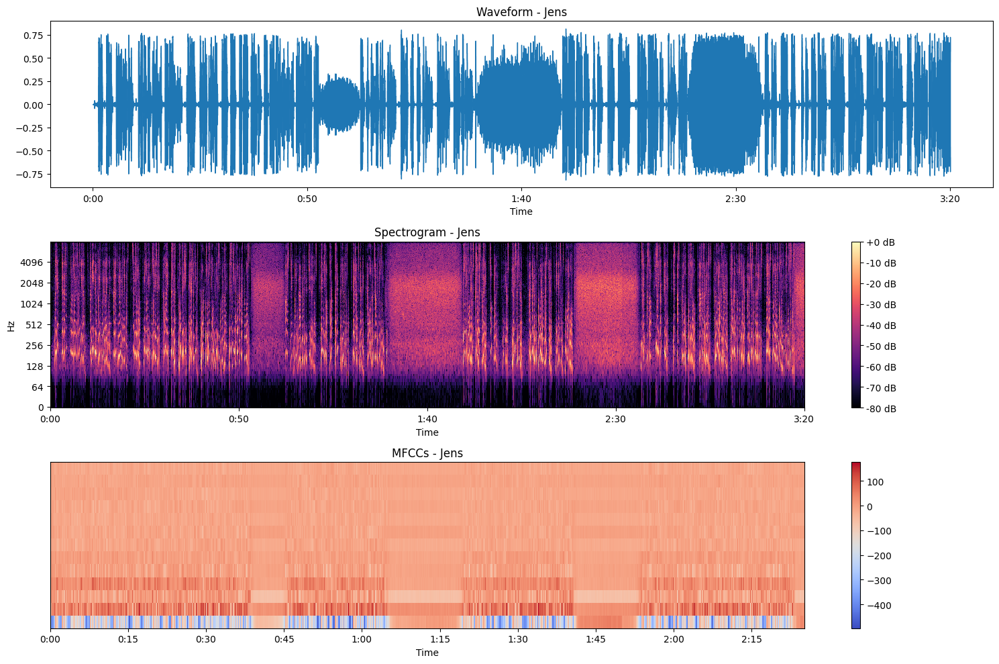

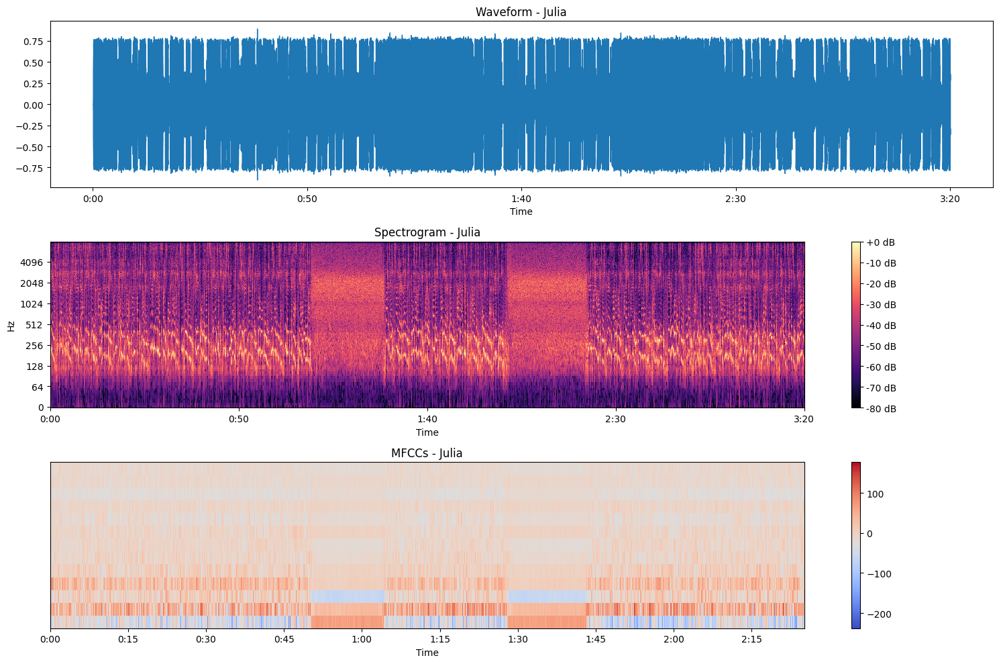

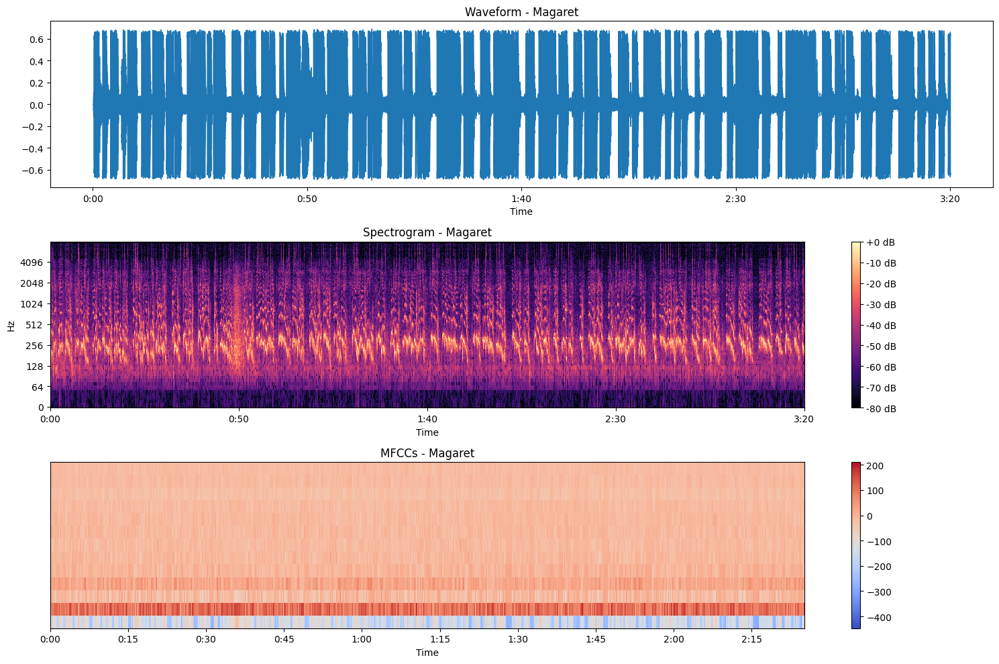

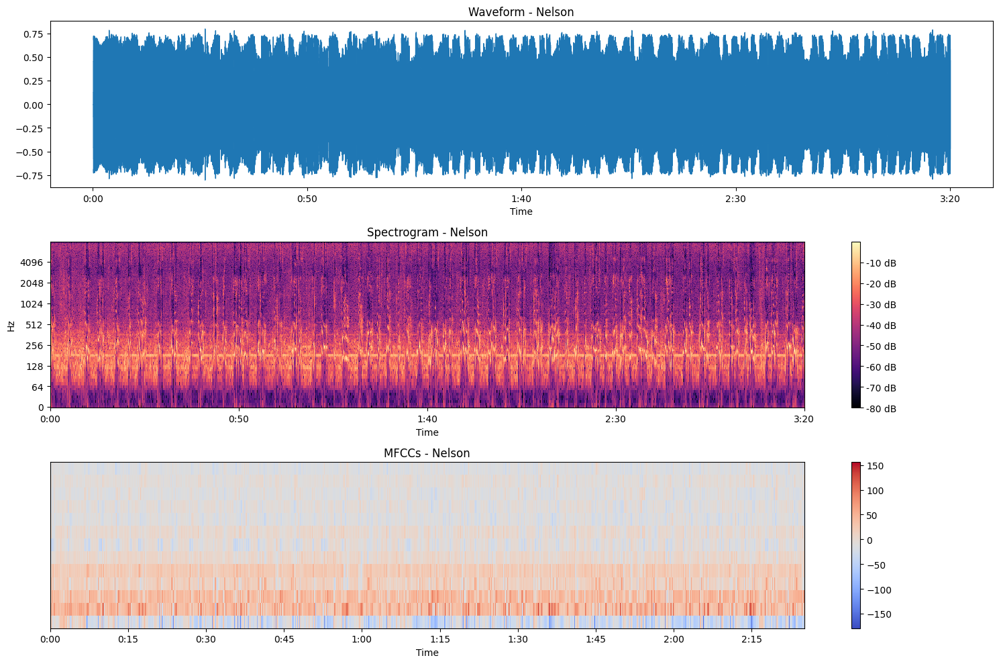

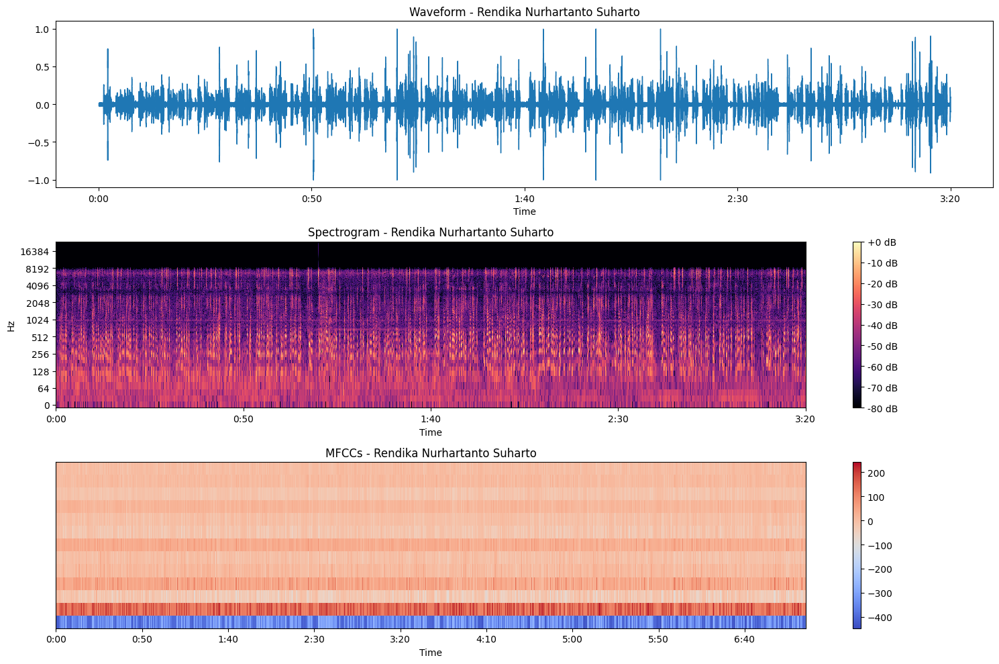

In [83]:
import librosa.display

# Function to plot the waveform, spectrogram, and MFCCs
def plot_audio_features(audio_path):
    # Load audio file
    y, sr = librosa.load(audio_path, sr=None)

    # Extract speaker name from the file path
    speaker_name = os.path.basename(audio_path).split('_')[0]

    # Plot the waveform
    plt.figure(figsize=(15, 10))
    plt.subplot(3, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'Waveform - {speaker_name}')

    # Plot the spectrogram
    plt.subplot(3, 1, 2)
    D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram - {speaker_name}')

    # Plot the MFCCs
    plt.subplot(3, 1, 3)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar()
    plt.title(f'MFCCs - {speaker_name}')

    plt.tight_layout()
    plt.show()

from pathlib import Path


# Paths to the combined audio files
outputDataPath = Path(output_dir)
# Ambil semua path data di dalam direktori
all_data_paths = list(outputDataPath.glob("*"))

# Plot features for each audio file
for audio_path in all_data_paths:
    plot_audio_features(audio_path)

# FEATURE EXTRACTION

In [66]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# Set the parent directory for speaker folders
parent_dir = dataPath

# List of speaker folders
speaker_folders = [
    "Benjamin_Netanyau",
    "Jens_Stoltenberg",
    "Julia_Gillard",
    "Magaret_Tarcher",
    "Nelson_Mandela"
]

def extract_features(parent_dir, speaker_folders):
    features = []
    labels = []

    for i, speaker_folder in enumerate(speaker_folders):
        speaker_folder_path = os.path.join(parent_dir, speaker_folder)

        for filename in os.listdir(speaker_folder_path):
            if filename.endswith(".wav"):
                file_path = os.path.join(speaker_folder_path, filename)
                audio, sr = librosa.load(file_path, sr=None, duration=1)
                mfccs = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=13)

                # Normalize MFCC features
                mfccs = StandardScaler().fit_transform(mfccs)

                features.append(mfccs.T)
                labels.append(i)

    return np.array(features), np.array(labels)

# Extract features and labels
X, y = extract_features(parent_dir, speaker_folders)

In [67]:
# # Print the first few features
# for feature in X[:1]:
#     print(feature)

In [69]:
# print(tf.config.list_physical_devices('GPU'))

# Model Set-up and Train/Test Split

In [70]:
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import LabelEncoder

# Encode labels with explicit classes
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)
label_encoder.classes_ = np.array(speaker_folders)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Print the shapes of training and validation data
print("Training Data Shape:", X_train.shape)
print("Validation Data Shape:", X_val.shape)

Training Data Shape: (5250, 32, 13)
Validation Data Shape: (1125, 32, 13)


In [76]:
# Define the RRN Model

model = tf.keras.Sequential([
    tf.keras.layers.LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2])),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(len(speaker_folders), activation='softmax')
])

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

In [77]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 128)               72704     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 5)                 325       
                                                                 
Total params: 81285 (317.52 KB)
Trainable params: 81285 (317.52 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


# Training Model

In [78]:
# Train the model with EarlyStopping
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20, batch_size=32, callbacks=[early_stopping])

# Check if EarlyStopping triggered
if early_stopping.stopped_epoch > 0:
    print("Early stopping triggered at epoch", early_stopping.stopped_epoch + 1)
else:
    print("Training completed without early stopping")

Epoch 1/20
165/165 [==============================] - 14s 66ms/step - loss: 0.5165 - accuracy: 0.7920 - val_loss: 0.3104 - val_accuracy: 0.8622
Epoch 2/20
165/165 [==============================] - 9s 56ms/step - loss: 0.2011 - accuracy: 0.9293 - val_loss: 0.2289 - val_accuracy: 0.9200
Epoch 3/20
165/165 [==============================] - 8s 51ms/step - loss: 0.1477 - accuracy: 0.9490 - val_loss: 0.1329 - val_accuracy: 0.9556
Epoch 4/20
165/165 [==============================] - 10s 60ms/step - loss: 0.1166 - accuracy: 0.9608 - val_loss: 0.1147 - val_accuracy: 0.9662
Epoch 5/20
165/165 [==============================] - 7s 44ms/step - loss: 0.0892 - accuracy: 0.9674 - val_loss: 0.1302 - val_accuracy: 0.9609
Epoch 6/20
165/165 [==============================] - 10s 61ms/step - loss: 0.0791 - accuracy: 0.9737 - val_loss: 0.1058 - val_accuracy: 0.9644
Epoch 7/20
165/165 [==============================] - 7s 45ms/step - loss: 0.0640 - accuracy: 0.9775 - val_loss: 0.1677 - val_accuracy: 0.9

# Evaluation

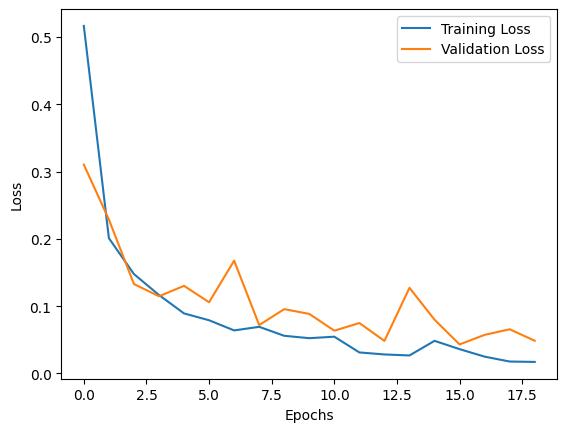

In [79]:
# Plot training vs validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

36/36 [==============================] - 1s 22ms/step
Test Evaluation Accuracy: 0.9920071047957372
Weighted F1 Score: 0.9920006386249323


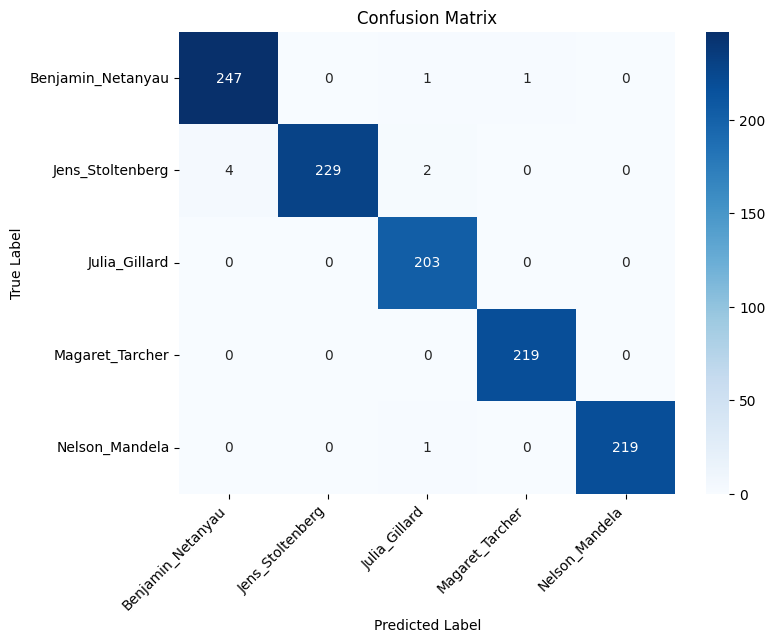

In [80]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, f1_score

# Evaluate the model on the test set
y_pred_probabilities = model.predict(X_test)
y_pred = np.argmax(y_pred_probabilities, axis=1)

# Decode labels back to original format
y_test_decoded = label_encoder.inverse_transform(y_test)
y_pred_decoded = label_encoder.inverse_transform(y_pred)

# Create a confusion matrix
conf_matrix = confusion_matrix(y_test_decoded, y_pred_decoded, labels=speaker_folders)

# Calculate accuracy
accuracy = accuracy_score(y_test_decoded, y_pred_decoded)
print(f"Test Evaluation Accuracy: {accuracy}")

# Calculate F1 score
f1 = f1_score(y_test_decoded, y_pred_decoded, labels=speaker_folders, average='weighted')
print(f"Weighted F1 Score: {f1}")

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=speaker_folders, yticklabels=speaker_folders)

# Rotate x-axis labels by 45 degrees
plt.xticks(rotation=45, ha="right")

plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

In [82]:
# Simpan model dengan format .keras
model.save(os.path.join(mainPath, "speaker_recognition.keras"))